In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"
import seaborn as sns
sns.set()

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn import metrics

data = pd.read_csv("C:/Users/HP/Downloads/Trains.csv")
print(data.head())

     ID  Customer_ID  Month           Name  Age        SSN Occupation  \
0  5634         3392      1  Aaron Maashoh   23  821000265  Scientist   
1  5635         3392      2  Aaron Maashoh   23  821000265  Scientist   
2  5636         3392      3  Aaron Maashoh   23  821000265  Scientist   
3  5637         3392      4  Aaron Maashoh   23  821000265  Scientist   
4  5638         3392      5  Aaron Maashoh   23  821000265  Scientist   

   Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  ...  Credit_Mix  \
0       19114.12            1824.843333                  3  ...        Good   
1       19114.12            1824.843333                  3  ...        Good   
2       19114.12            1824.843333                  3  ...        Good   
3       19114.12            1824.843333                  3  ...        Good   
4       19114.12            1824.843333                  3  ...        Good   

   Outstanding_Debt  Credit_Utilization_Ratio Credit_History_Age  \
0            809.9

In [2]:
#Data exploration
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  int64  
 5   SSN                       100000 non-null  int64  
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  int64  
 13  Type_of_Loan              100000 non-null  ob

In [3]:
#Finding null values
print(data.isnull().sum())

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64


In [4]:
data["Credit_Score"].value_counts()

Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

In [5]:
#Finding monthly balance

fig = px.box(data, 
             x="Credit_Score", 
             y="Monthly_Balance", 
             color="Credit_Score", 
             title="Credit Scores Based on Monthly Balance Left",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.update_traces(quartilemethod="exclusive")
fig.show()

In [6]:
#Credit mix
data["Credit_Mix"] = data["Credit_Mix"].map({"Standard": 1, 
                               "Good": 2, 
                               "Bad": 0})

In [7]:
#Split the data
from sklearn.model_selection import train_test_split
x = np.array(data[["Annual_Income", "Monthly_Inhand_Salary", 
                   "Num_Bank_Accounts", "Num_Credit_Card", 
                   "Interest_Rate", "Num_of_Loan", 
                   "Delay_from_due_date", "Num_of_Delayed_Payment", 
                   "Credit_Mix", "Outstanding_Debt", 
                   "Credit_History_Age", "Monthly_Balance"]])
y = np.array(data[["Credit_Score"]])

In [8]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.33, random_state=42)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(xtrain, ytrain)

C:\Users\HP\AppData\Local\Temp\ipykernel_8964\1653326088.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier()

In [9]:
#Score prediction

print("Credit Score Prediction : ")
a = float(input("Annual Income: "))
b = float(input("Monthly Inhand Salary: "))
c = float(input("Number of Bank Accounts: "))
d = float(input("Number of Credit cards: "))
e = float(input("Interest rate: "))
f = float(input("Number of Loans: "))
g = float(input("Average number of days delayed by the person: "))
h = float(input("Number of delayed payments: "))
i = input("Credit Mix (Bad: 0, Standard: 1, Good: 3) : ")
j = float(input("Outstanding Debt: "))
k = float(input("Credit History Age: "))
l = float(input("Monthly Balance: "))

features = np.array([[a, b, c, d, e, f, g, h, i, j, k, l]])
print("Predicted Credit Score = ", model.predict(features))

Credit Score Prediction : 
Annual Income: 400000
Monthly Inhand Salary: 30000
Number of Bank Accounts: 2
Number of Credit cards: 2
Interest rate: 10
Number of Loans: 3
Average number of days delayed by the person: 2
Number of delayed payments: 2
Credit Mix (Bad: 0, Standard: 1, Good: 3) : 1
Outstanding Debt: 20
Credit History Age: 23
Monthly Balance: 3000
Predicted Credit Score =  ['Standard']


In [10]:
print("Credit Score Prediction : ")
a = float(input("Annual Income: "))
b = float(input("Monthly Inhand Salary: "))
c = float(input("Number of Bank Accounts: "))
d = float(input("Number of Credit cards: "))
e = float(input("Interest rate: "))
f = float(input("Number of Loans: "))
g = float(input("Average number of days delayed by the person: "))
h = float(input("Number of delayed payments: "))
i = input("Credit Mix (Bad: 0, Standard: 1, Good: 3) : ")
j = float(input("Outstanding Debt: "))
k = float(input("Credit History Age: "))
l = float(input("Monthly Balance: "))

features = np.array([[a, b, c, d, e, f, g, h, i, j, k, l]])
print("Predicted Credit Score = ", model.predict(features))


Credit Score Prediction : 
Annual Income: 300000
Monthly Inhand Salary: 25000
Number of Bank Accounts: 3
Number of Credit cards: 2
Interest rate: 20
Number of Loans: 4
Average number of days delayed by the person: 3
Number of delayed payments: 2
Credit Mix (Bad: 0, Standard: 1, Good: 3) : 0
Outstanding Debt: 20
Credit History Age: 24
Monthly Balance: 2000
Predicted Credit Score =  ['Standard']


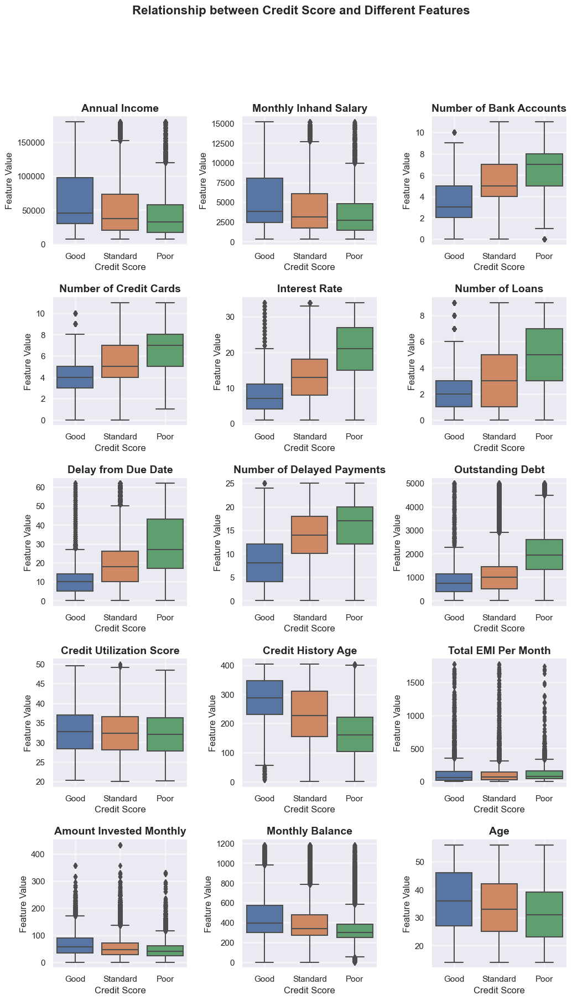

In [11]:
# Create a figure and 2x3 grid of subplots
fig, ax = plt.subplots(5, 3, figsize=(12, 20))

# Flatten the 2D array of subplots into a 1D array
ax = ax.flatten()

# Plot multiple box plots on the same axis
sns.boxplot(x='Credit_Score', y='Annual_Income', data=data, ax=ax[0])
sns.boxplot(x='Credit_Score', y='Monthly_Inhand_Salary', data=data, ax=ax[1])
sns.boxplot(x='Credit_Score', y='Num_Bank_Accounts', data=data, ax=ax[2])
sns.boxplot(x='Credit_Score', y='Num_Credit_Card', data=data, ax=ax[3])
sns.boxplot(x='Credit_Score', y='Interest_Rate', data=data, ax=ax[4])
sns.boxplot(x='Credit_Score', y='Num_of_Loan', data=data, ax=ax[5])
sns.boxplot(x='Credit_Score', y='Delay_from_due_date', data=data, ax=ax[6])
sns.boxplot(x='Credit_Score', y='Num_of_Delayed_Payment', data=data, ax=ax[7])
sns.boxplot(x='Credit_Score', y='Outstanding_Debt', data=data, ax=ax[8])
sns.boxplot(x='Credit_Score', y='Credit_Utilization_Ratio', data=data, ax=ax[9])
sns.boxplot(x='Credit_Score', y='Credit_History_Age', data=data, ax=ax[10])
sns.boxplot(x='Credit_Score', y='Total_EMI_per_month', data=data, ax=ax[11])
sns.boxplot(x='Credit_Score', y='Amount_invested_monthly', data=data, ax=ax[12])
sns.boxplot(x='Credit_Score', y='Monthly_Balance', data=data, ax=ax[13])
sns.boxplot(x='Credit_Score', y='Age', data=data, ax=ax[14])

# Add a title and labels
#plt.title('Relationship between Credit Score and Different Features')
plt.xlabel('Credit Score')
plt.ylabel('Feature Value')

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Add a white grid
for i in range(15):
    ax[i].grid(color='white', linestyle='-', linewidth=2, alpha=0.5)

# Add a title and labels
fig.suptitle('Relationship between Credit Score and Different Features', fontsize=16, fontweight='bold')

# Set the font size for all subplot titles
titles = ['Annual Income', 'Monthly Inhand Salary', 'Number of Bank Accounts', 'Number of Credit Cards', 
          'Interest Rate', 'Number of Loans', 'Delay from Due Date', 'Number of Delayed Payments',
          'Outstanding Debt', 'Credit Utilization Score', 'Credit History Age', 'Total EMI Per Month',
          'Amount Invested Monthly', 'Monthly Balance', 'Age']
for i in range(15):
    ax[i].set_title(titles[i], fontsize=14, fontweight='bold')

# Set the font size for all x and y labels
for i in range(15):
    ax[i].set_xlabel('Credit Score', fontsize=12)
    ax[i].set_ylabel('Feature Value', fontsize=12)

# Show the plot
plt.show()

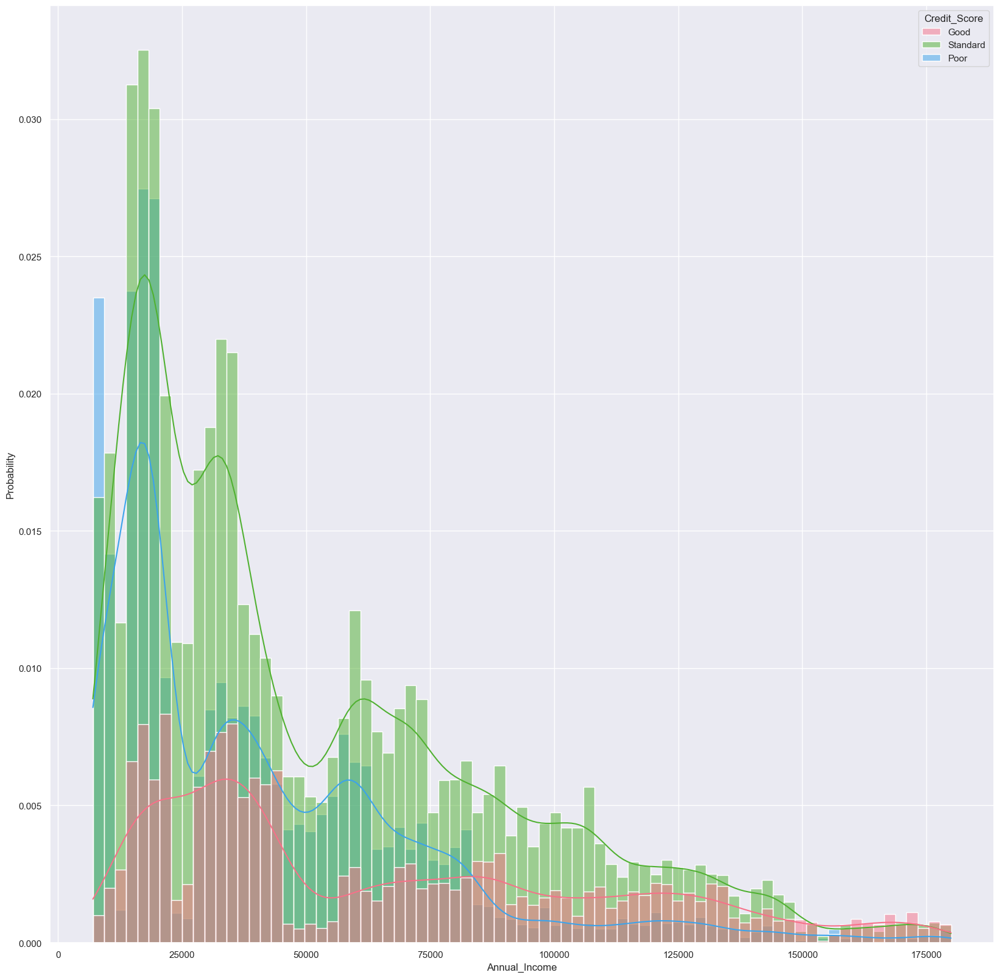

In [12]:
plt.figure(figsize = (20,20))
sns.histplot(data = data, x = 'Annual_Income', hue = 'Credit_Score', kde = True, stat = 'probability', palette = 'husl')
plt.show()

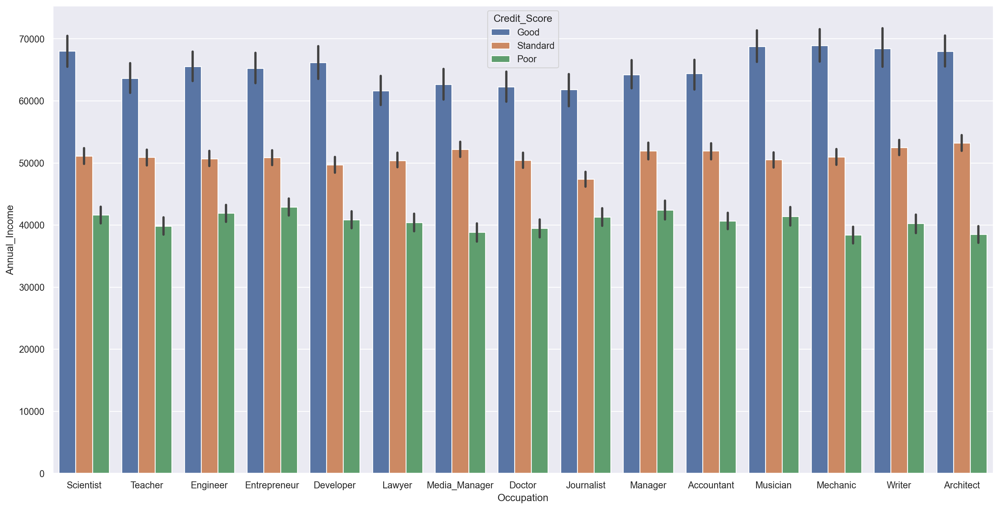

In [13]:
#Occupation annual income
plt.figure(figsize = (20, 10), dpi = 200)
sns.barplot(data = data, x = 'Occupation', y = 'Annual_Income', hue = 'Credit_Score')
plt.show()

In [14]:
# Importing train_test_split and splitting the data in X (features) and y(target)
from sklearn.model_selection import train_test_split
X = data[["Annual_Income", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Num_Credit_Card", "Interest_Rate", "Num_of_Loan", 
        "Delay_from_due_date", "Num_of_Delayed_Payment", "Credit_Mix", "Outstanding_Debt", "Credit_History_Age", 
        "Monthly_Balance"]].values
y = data['Credit_Score'].values

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [16]:
#RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=300, class_weight='balanced')
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', n_estimators=300)

In [17]:
# Making predictions on our model using the test data
predictions = model.predict(X_test)
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
print('Classification Report', classification_report(y_test, predictions))
print('\n')
print('Confusion Matrix', confusion_matrix(y_test, predictions))
print('\n')
print('Accuracy Score', accuracy_score(y_test, predictions))

Classification Report               precision    recall  f1-score   support

        Good       0.78      0.75      0.77      5866
        Poor       0.80      0.83      0.81      9633
    Standard       0.82      0.81      0.82     17501

    accuracy                           0.81     33000
   macro avg       0.80      0.80      0.80     33000
weighted avg       0.81      0.81      0.81     33000



Confusion Matrix [[ 4417    29  1420]
 [   21  7951  1661]
 [ 1242  2005 14254]]


Accuracy Score 0.8067272727272727


In [18]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state = 0)
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
print('Accuracy of Logistic Regression on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Logistic Regression on test set: {:.2f}'.format(clf.score(X_test, y_test)))

print("\n Classification report for classifier %s:\n%s\n" % (clf, metrics.classification_report(y_test, prediction)))


C:\Users\HP\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy of Logistic Regression on training set: 0.54
Accuracy of Logistic Regression on test set: 0.54

 Classification report for classifier LogisticRegression(random_state=0):
              precision    recall  f1-score   support

        Good       0.42      0.05      0.08      5866
        Poor       0.53      0.32      0.40      9633
    Standard       0.55      0.83      0.66     17501

    accuracy                           0.54     33000
   macro avg       0.50      0.40      0.38     33000
weighted avg       0.52      0.54      0.48     33000




In [19]:
#DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
print('Accuracy of Decision Tree on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree on test set: {:.2f}'.format(clf.score(X_test, y_test)))

print("\n Classification report for classifier %s:\n%s\n" % (clf, metrics.classification_report(y_test, prediction)))


Accuracy of Decision Tree on training set: 1.00
Accuracy of Decision Tree on test set: 0.76

 Classification report for classifier DecisionTreeClassifier(criterion='entropy', random_state=0):
              precision    recall  f1-score   support

        Good       0.70      0.71      0.70      5866
        Poor       0.75      0.75      0.75      9633
    Standard       0.78      0.78      0.78     17501

    accuracy                           0.76     33000
   macro avg       0.74      0.74      0.74     33000
weighted avg       0.76      0.76      0.76     33000




In [20]:
#KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean')
knn.fit(X_train, y_train)
prediction = knn.predict(X_test)
print('Accuracy of KNeighbors Classifier on training set: {:.2f}'.format(knn.score(X_train, y_train)))
print('Accuracy of KNeighbors Classifier on test set: {:.2f}'.format(knn.score(X_test, y_test)))

print("\n Classification report for classifier %s:\n%s\n" % (knn, metrics.classification_report(y_test, prediction)))


Accuracy of KNeighbors Classifier on training set: 0.84
Accuracy of KNeighbors Classifier on test set: 0.75

 Classification report for classifier KNeighborsClassifier(metric='euclidean'):
              precision    recall  f1-score   support

        Good       0.66      0.66      0.66      5866
        Poor       0.75      0.79      0.77      9633
    Standard       0.79      0.76      0.77     17501

    accuracy                           0.75     33000
   macro avg       0.73      0.74      0.73     33000
weighted avg       0.75      0.75      0.75     33000




In [21]:
# Define a list of machine learning algorithms to compare
models = [
    ('Random Forest', RandomForestClassifier()),
    ('Logistic Regression', LogisticRegression()),
    ('Decision Tree Classifier', DecisionTreeClassifier()),
    ('KNN', KNeighborsClassifier()),
    
    
    
    
]

# Create a table to store the results
results_table = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1_Score' ])

# Evaluate each model and add its performance to the table
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    results_table = results_table.append({'Model': name, 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1_Score': f1}, ignore_index=True)

# Print the results table
print(results_table)

C:\Users\HP\AppData\Local\Temp\ipykernel_8964\4164369486.py:24: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\HP\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\HP\AppData\Local\Temp\ipykernel_8964\4164369486.py:24: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\HP\AppData\Local\Temp

                      Model  Accuracy  Precision    Recall  F1_Score
0             Random Forest  0.807000   0.807263  0.807000  0.806980
1       Logistic Regression  0.541788   0.518775  0.541788  0.481565
2  Decision Tree Classifier  0.752788   0.752702  0.752788  0.752743
3                       KNN  0.752364   0.752860  0.752364  0.752405


In [22]:
print(X_train.shape)
print(X_test.shape)

(67000, 12)
(33000, 12)
